## Dataset Information

The training archive contains 25,000 images of dogs and cats. Train your algorithm on these files and predict the labels

(1 = dog, 0 = cat).

## Import Modules

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
import tensorflow
from keras.preprocessing.image import load_img
from keras.preprocessing.image import ImageDataGenerator
warnings.filterwarnings('ignore')

## Create Dataframe for Input and Output

In [2]:
input_path = []
label = []

for class_name in os.listdir("PetImages"):
    for path in os.listdir("PetImages/"+class_name):
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("PetImages", class_name, path))
print(input_path[0], label[0])

PetImages\Cat\0.jpg 0


In [3]:
len(label),len(input_path)

(24998, 24998)

In [4]:
df=pd.DataFrame()
df["images"]=input_path
df["label"]=label
df= df.sample(frac=1).reset_index(drop=True)  #Shuffle the dataset
df.head()

,images,label
0,PetImages\Cat\2651.jpg,0
1,PetImages\Cat\7726.jpg,0
2,PetImages\Dog\4697.jpg,1
3,PetImages\Dog\8071.jpg,1
4,PetImages\Dog\5385.jpg,1


In [ ]:
import PIL
l = []
for image in df['images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)
l

In [ ]:
# delete db files
df = df[df['images']!='PetImages/Dog/Thumbs.db']
df = df[df['images']!='PetImages/Cat/Thumbs.db']
df = df[df['images']!='PetImages/Cat/666.jpg']
df = df[df['images']!='PetImages/Dog/11702.jpg']

## Exploratory Data Analysis

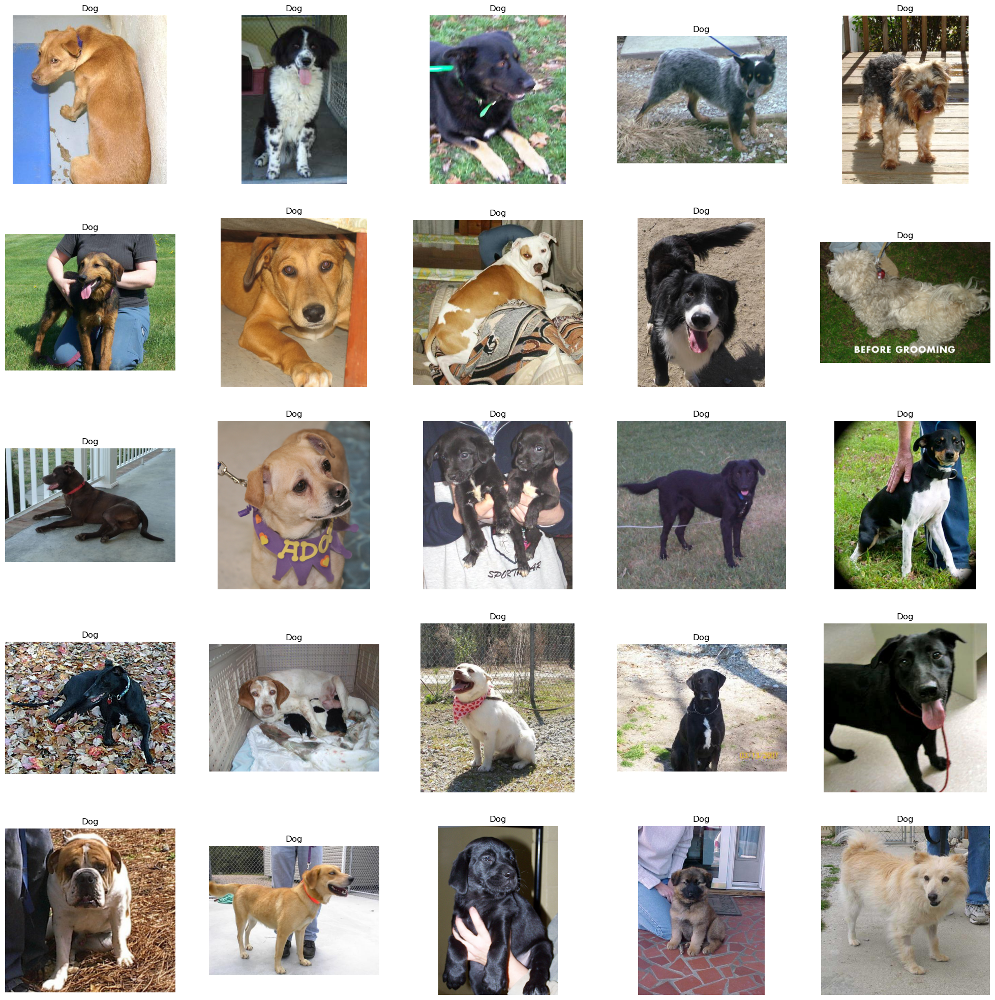

In [5]:
# to display grid of images
plt.figure(figsize=(25,25))
temp=df[df["label"]==1]["images"]
start=random.randint(0,len(temp))
files=temp[start:start+25]
for index,file in enumerate(files):
    plt.subplot(5,5,index+1)
    img=load_img(file)
    img=np.array(img)
    plt.imshow(img)
    plt.title("Dog")
    plt.axis("off")

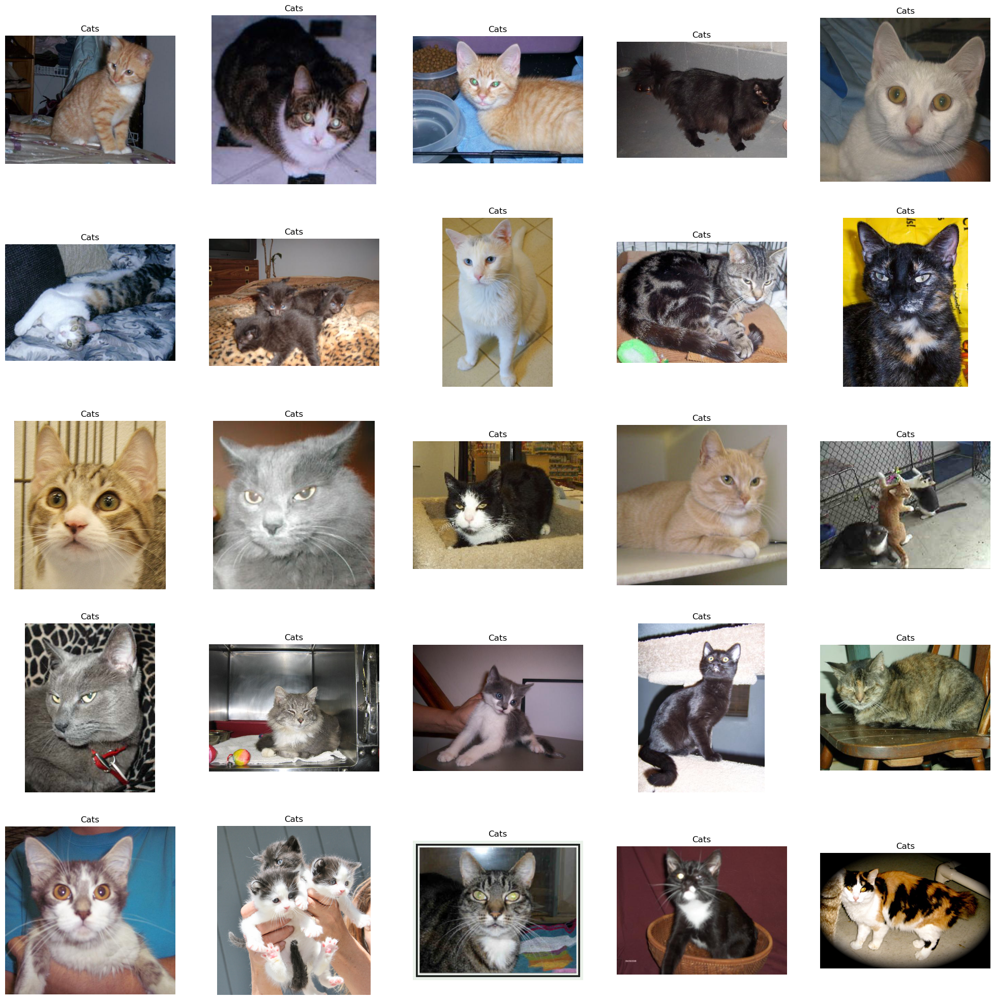

In [6]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

## Create DataGenerator for the Images

In [7]:
df['label'] = df['label'].astype('str')

In [8]:
df.head()

,images,label
0,PetImages\Cat\2651.jpg,0
1,PetImages\Cat\7726.jpg,0
2,PetImages\Dog\4697.jpg,1
3,PetImages\Dog\8071.jpg,1
4,PetImages\Dog\5385.jpg,1


In [9]:
# input split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [10]:
from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255,  # normalization of images
    rotation_range = 40, # augmention of images to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train, 
    x_col='images', 
    y_col='label', 
    target_size=(128,128), 
    batch_size=64, 
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test, 
    x_col='images', 
    y_col='label', 
    target_size=(128,128), 
    batch_size=64, 
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


## Model Creation

In [11]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

model = Sequential([
                    Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
                    MaxPool2D((2,2)),
                    Conv2D(32, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Conv2D(64, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Flatten(),
                    Dense(512, activation='relu'),
                    Dense(1, activation='sigmoid')
])

In [12]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 14, 14, 64)        

In [13]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)

Epoch 1/10


313/313 [==============================] - 407s 1s/step - loss: 0.6571 - accuracy: 0.6138 - val_loss: 0.5991 - val_accuracy: 0.6562
Epoch 2/10
313/313 [==============================] - 421s 1s/step - loss: 0.5655 - accuracy: 0.7058 - val_loss: 0.5002 - val_accuracy: 0.7540
Epoch 3/10
313/313 [==============================] - 340s 1s/step - loss: 0.5224 - accuracy: 0.7412 - val_loss: 0.4802 - val_accuracy: 0.7632
Epoch 4/10
313/313 [==============================] - 350s 1s/step - loss: 0.4883 - accuracy: 0.7641 - val_loss: 0.4522 - val_accuracy: 0.7810
Epoch 5/10
313/313 [==============================] - 341s 1s/step - loss: 0.4648 - accuracy: 0.7815 - val_loss: 0.4250 - val_accuracy: 0.8010
Epoch 6/10
313/313 [==============================] - 358s 1s/step - loss: 0.4363 - accuracy: 0.7989 - val_loss: 0.3950 - val_accuracy: 0.8182
Epoch 7/10
313/313 [==============================] - 343s 1s/step - loss: 0.4205 - accuracy: 0.8065 - val_loss: 0.4044 - val_accuracy: 0.80

## Visualization of Results

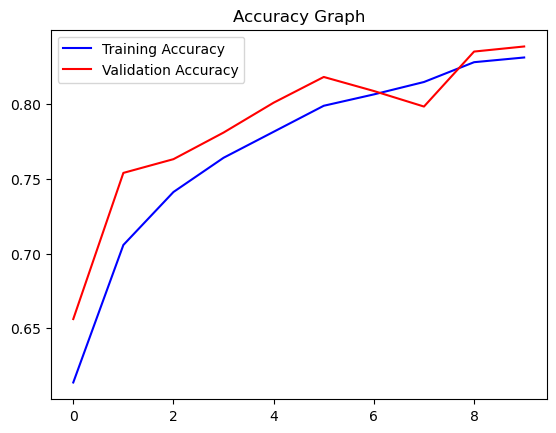

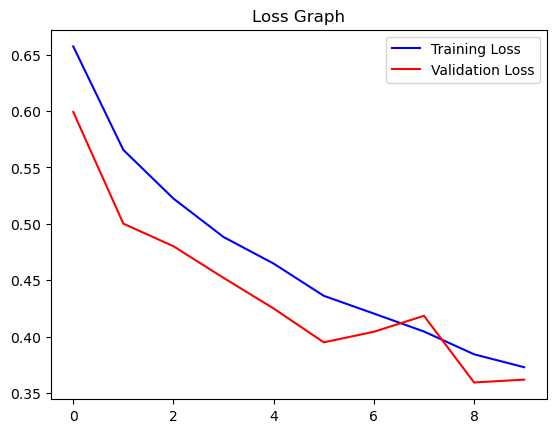

In [14]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

## Test with Real Image

In [15]:
image_path = "14.jpg" # path of the image
img = load_img(image_path, target_size=(128, 128))
img = np.array(img)
img = img / 255.0 # normalize the image
img = img.reshape(1, 128, 128, 3) # reshape for prediction
pred = model.predict(img)
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'
print(label)

1/1 [==============================] - 1s 939ms/step
Dog


In [16]:
model.save('dogs_vs_cats_model.h5')